In [1]:
#Importamos las librerias
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')

In [42]:
df = pd.read_csv('/content/dataset-of-00s.csv')
df.head()


,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
0,Lucky Man,Montgomery Gentry,spotify:track:4GiXBCUF7H6YfNQsnBRIzl,0.578,0.471,4,-7.270,1,0.0289,0.368000,0.00000,0.159,0.532,133.061,196707,4,30.88059,13,1
1,On The Hotline,Pretty Ricky,spotify:track:1zyqZONW985Cs4osz9wlsu,0.704,0.854,10,-5.477,0,0.1830,0.018500,0.00000,0.148,0.688,92.988,242587,4,41.51106,10,1
2,Clouds Of Dementia,Candlemass,spotify:track:6cHZf7RbxXCKwEkgAZT4mY,0.162,0.836,9,-3.009,1,0.0473,0.000111,0.00457,0.174,0.300,86.964,338893,4,65.32887,13,0
3,"Heavy Metal, Raise Hell!",Zwartketterij,spotify:track:2IjBPp2vMeX7LggzRN3iSX,0.188,0.994,4,-3.745,1,0.1660,0.000007,0.07840,0.192,0.333,148.440,255667,4,58.59528,9,0
4,I Got A Feelin',Billy Currington,spotify:track:1tF370eYXUcWwkIvaq3IGz,0.630,0.764,2,-4.353,1,0.0275,0.363000,0.00000,0.125,0.631,112.098,193760,4,22.62384,10,1


In [44]:
#Eliminamos las 3 columnas que no contienen datos numericos

df = df.drop(['artist', 'uri', 'track'], axis=1)

In [45]:
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
0,0.578,0.471,4,-7.270,1,0.0289,0.368000,0.00000,0.159,0.532,133.061,196707,4,30.88059,13,1
1,0.704,0.854,10,-5.477,0,0.1830,0.018500,0.00000,0.148,0.688,92.988,242587,4,41.51106,10,1
2,0.162,0.836,9,-3.009,1,0.0473,0.000111,0.00457,0.174,0.300,86.964,338893,4,65.32887,13,0
3,0.188,0.994,4,-3.745,1,0.1660,0.000007,0.07840,0.192,0.333,148.440,255667,4,58.59528,9,0
4,0.630,0.764,2,-4.353,1,0.0275,0.363000,0.00000,0.125,0.631,112.098,193760,4,22.62384,10,1


In [47]:
#Verificamos los tipos de datos
df.dtypes

danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
duration_ms           int64
time_signature        int64
chorus_hit          float64
sections              int64
target                int64
dtype: object

In [48]:
#Validacion cambio de dato
df.dtypes

danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
duration_ms           int64
time_signature        int64
chorus_hit          float64
sections              int64
target                int64
dtype: object

In [49]:
#Shape
df.shape

(5872, 16)

In [50]:
#Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5872 entries, 0 to 5871
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   danceability      5872 non-null   float64
 1   energy            5872 non-null   float64
 2   key               5872 non-null   int64  
 3   loudness          5872 non-null   float64
 4   mode              5872 non-null   int64  
 5   speechiness       5872 non-null   float64
 6   acousticness      5872 non-null   float64
 7   instrumentalness  5872 non-null   float64
 8   liveness          5872 non-null   float64
 9   valence           5872 non-null   float64
 10  tempo             5872 non-null   float64
 11  duration_ms       5872 non-null   int64  
 12  time_signature    5872 non-null   int64  
 13  chorus_hit        5872 non-null   float64
 14  sections          5872 non-null   int64  
 15  target            5872 non-null   int64  
dtypes: float64(10), int64(6)
memory usage: 734

In [51]:
#Renombrar la columna target a exito, ya que indica si esa cancion formo parte del "HOT-100" y por esto es considerada exitosa
df.DiabetesPedigreeFunction = df.rename({'target':'exito'},inplace = True,axis =1)
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,exito
0,0.578,0.471,4,-7.270,1,0.0289,0.368000,0.00000,0.159,0.532,133.061,196707,4,30.88059,13,1
1,0.704,0.854,10,-5.477,0,0.1830,0.018500,0.00000,0.148,0.688,92.988,242587,4,41.51106,10,1
2,0.162,0.836,9,-3.009,1,0.0473,0.000111,0.00457,0.174,0.300,86.964,338893,4,65.32887,13,0
3,0.188,0.994,4,-3.745,1,0.1660,0.000007,0.07840,0.192,0.333,148.440,255667,4,58.59528,9,0
4,0.630,0.764,2,-4.353,1,0.0275,0.363000,0.00000,0.125,0.631,112.098,193760,4,22.62384,10,1


In [52]:
#Reemplazar el target de 1 a 'Exito' y 0 a 'No exito'
df.exito = df.exito.replace({0:'Exito',1:'No Exito'})
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,exito
0,0.578,0.471,4,-7.270,1,0.0289,0.368000,0.00000,0.159,0.532,133.061,196707,4,30.88059,13,No Exito
1,0.704,0.854,10,-5.477,0,0.1830,0.018500,0.00000,0.148,0.688,92.988,242587,4,41.51106,10,No Exito
2,0.162,0.836,9,-3.009,1,0.0473,0.000111,0.00457,0.174,0.300,86.964,338893,4,65.32887,13,Exito
3,0.188,0.994,4,-3.745,1,0.1660,0.000007,0.07840,0.192,0.333,148.440,255667,4,58.59528,9,Exito
4,0.630,0.764,2,-4.353,1,0.0275,0.363000,0.00000,0.125,0.631,112.098,193760,4,22.62384,10,No Exito


In [53]:
#Estadisticos básicos
df.describe().T

,count,mean,std,min,25%,50%,75%,max
danceability,5872.0,0.542931,0.190003,0.058800,0.416000,0.556000,0.681000,9.860000e-01
energy,5872.0,0.694511,0.237792,0.000348,0.567000,0.744000,0.885000,9.990000e-01
key,5872.0,5.276396,3.564153,0.000000,2.000000,5.000000,8.000000,1.100000e+01
loudness,5872.0,-7.449258,5.102543,-47.327000,-8.315000,-6.041500,-4.562500,1.137000e+00
mode,5872.0,0.645095,0.478525,0.000000,0.000000,1.000000,1.000000,1.000000e+00
speechiness,5872.0,0.092360,0.094997,0.022400,0.036175,0.052700,0.107000,9.500000e-01
acousticness,5872.0,0.214374,0.296511,0.000000,0.004553,0.060300,0.312000,9.960000e-01
instrumentalness,5872.0,0.150917,0.301452,0.000000,0.000000,0.000022,0.047275,9.980000e-01
liveness,5872.0,0.196141,0.161965,0.019300,0.093700,0.131000,0.263000,9.870000e-01
valence,5872.0,0.482262,0.254567,0.000000,0.278000,0.486000,0.687000,9.820000e-01


<Figure size 720x480 with 0 Axes>

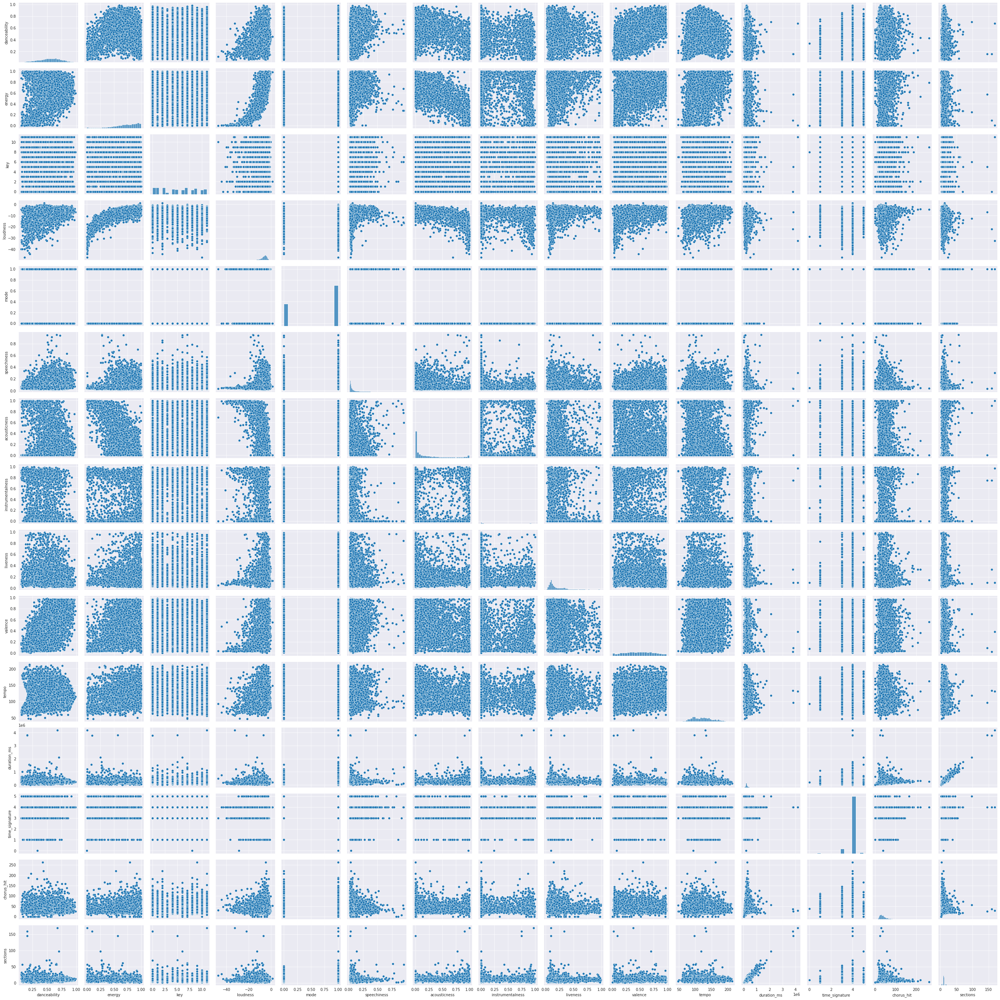

In [54]:
#Crear un Pairplot del dataset
plt.figure(dpi=120)
sns.pairplot(df)
plt.show()

<Figure size 720x480 with 0 Axes>

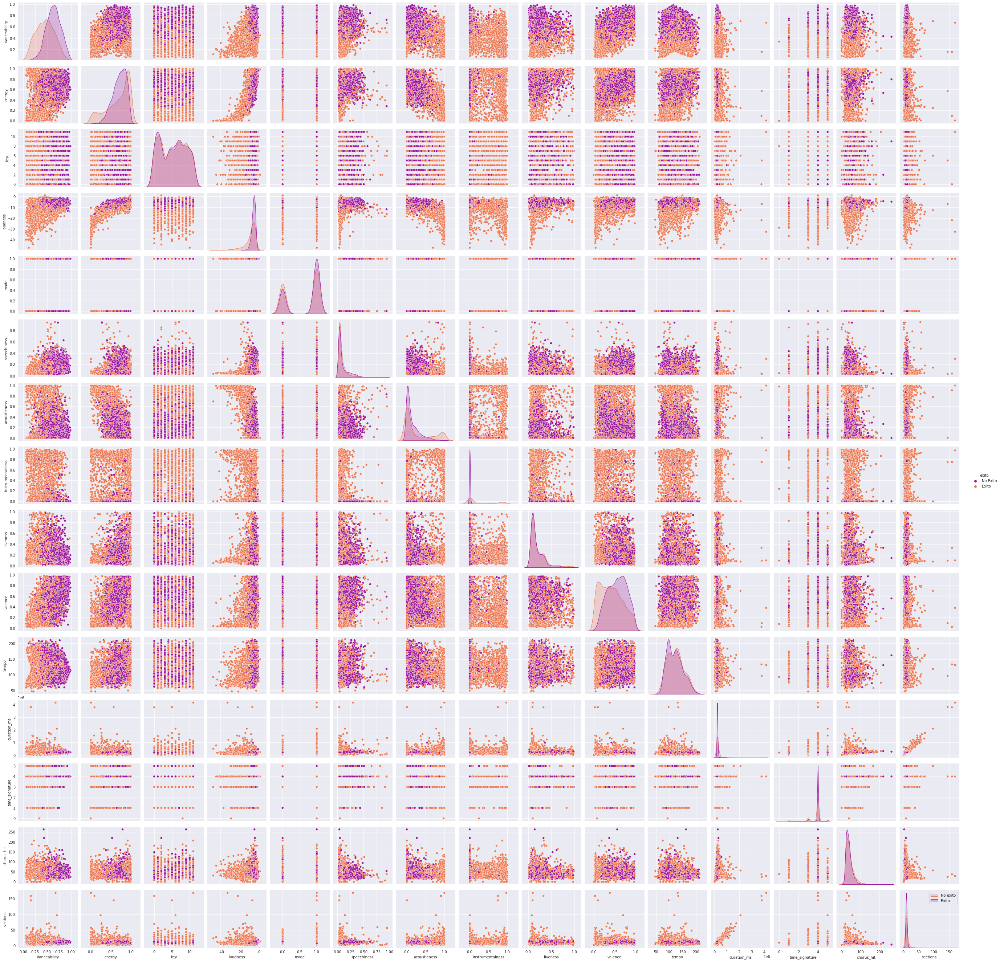

In [55]:
#Crear el Pairplot pero ahora con el atributo hue = 'exito'. Las leyendas deberán decir: 'Exito','No Exito'
plt.figure(dpi = 120)
sns.pairplot(df,hue = 'exito',palette = 'plasma')
plt.legend(['No exito','Exito'])
plt.show()

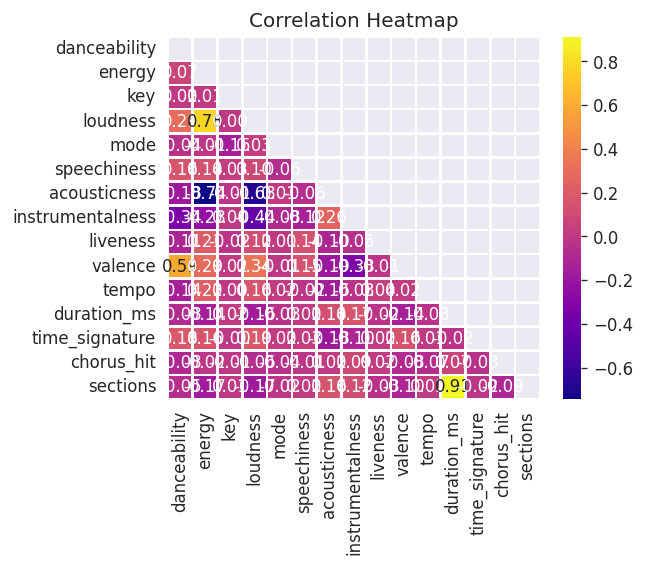

In [56]:
#Correlaciones
plt.figure(dpi = 120,figsize= (5,4))
mask = np.triu(np.ones_like(df.corr(),dtype = bool))
sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

In [59]:
#Crear el join plot entre Exito y el resto de las variables con su correspondiente interpretación.

col = list(df.columns)
idx = col.index('exito')

plt.figure(dpi = 100, figsize = (5,4))
print("Joint plot de exito con otras variables ==> \n")
for i in  range(idx+1,len(col)-1):
    print(f"Correlacion entre Exito y {col[i]} ==> ",df.corr().loc['exito'][col[i]])
    sns.jointplot(x='exito',y=col[i],data=df,kind = 'regression',color = 'green')
    plt.show()

Joint plot de exito con otras variables ==> 



<Figure size 500x400 with 0 Axes>